In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
import os

def plot_tokenizer_comparison():
    # Define the image paths and their corresponding information
    image_info = [
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Cosmos-0.1-Tokenizer-DI8x8/graph_theory1_45850.png',
            'model': 'Cosmos-0.1-Tokenizer-DI8x8',
            'tokens': 45850
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Cosmos-0.1-Tokenizer-DI16x16/graph_theory1_11397.png',
            'model': 'Cosmos-0.1-Tokenizer-DI16x16',
            'tokens': 11397
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/Emu3-VisionTokenizer/graph_theory1_16224.png',
            'model': 'Emu3-VisionTokenizer',
            'tokens': 16224
        },
        {
            'path': '/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets/OpenMAGViT2/graph_theory1_11616.png',
            'model': 'OpenMAGViT2',
            'tokens': 11616
        }
    ]
    
    # Create figure with subplots in a row
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    # fig.suptitle('Image Tokenizer Comparison', fontsize=16, fontweight='bold')
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                title = f"{info['model']}\n{info['tokens']:,} tokens"
                axes[i].set_title(title, fontsize=10, fontweight='bold', pad=10)
            else:
                # If file doesn't exist, show placeholder
                axes[i].text(0.5, 0.5, f"Image not found:\n{info['model']}\n{info['tokens']:,} tokens", 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=10, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{info['tokens']:,} tokens\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Make room for the main title
    
    # Show the plot
    plt.show()

In [2]:
def plot_tokenizer_comparison(image_base_name, base_path="/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets"):
    """
    Plot tokenizer comparison for four models.
    
    Args:
        image_base_name: The base image name (e.g., "graph_theory1")
        base_path: Base directory path containing model folders
    """
    
    # Define model folders and their display names
    models = [
        "Cosmos-0.1-Tokenizer-DI8x8",
        "Cosmos-0.1-Tokenizer-DI16x16", 
        "Emu3-VisionTokenizer",
        "OpenMAGViT2"
    ]
    
    # Function to find image file and extract token count
    def find_image_and_tokens(model_path, base_name):
        try:
            # Look for files matching the pattern: base_name_*.png
            if os.path.exists(model_path):
                files = os.listdir(model_path)
                matching_files = [f for f in files if f.startswith(base_name + '_') and f.endswith('.png')]
                
                if matching_files:
                    filename = matching_files[0]  # Take the first match
                    # Extract token count from filename
                    token_str = filename.split('_')[-1].replace('.png', '')
                    tokens = int(token_str)
                    return os.path.join(model_path, filename), tokens
                    
            return None, 0
        except Exception as e:
            print(f"Error finding image for {model_path}: {e}")
            return None, 0
    
    # Generate image info automatically
    image_info = []
    
    for model in models:
        # Handle special case for Emu3 path structure
        model_path = f"{base_path}/{model}"
            
        # Find the actual image file and extract token count
        full_path, tokens = find_image_and_tokens(model_path, image_base_name)
        
        image_info.append({
            'path': full_path,
            'model': model,
            'tokens': tokens
        })
    
    # Create figure with subplots in a row - bigger subplots, less space
    fig, axes = plt.subplots(1, 4, figsize=(30, 12))
    fig.subplots_adjust(wspace=0.1)  # Reduce horizontal space between subplots
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if info['path'] and os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                title = f"{info['model']}\n{info['tokens']:,} tokens"
                axes[i].set_title(title, fontsize=14, fontweight='bold', pad=10)
            else:
                # If file doesn't exist, show placeholder
                axes[i].text(0.5, 0.5, f"Image not found:\n{info['model']}\nSearching for: {image_base_name}_*.png", 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=8, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    # Minimal layout adjustment
    plt.tight_layout()
    
    # Show the plot
    plt.show()

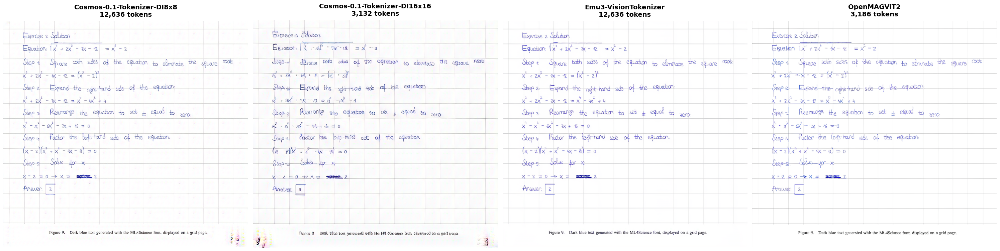

In [3]:
plot_tokenizer_comparison("math_draft1")


In [8]:
def plot_tokenizer_comparison_with_original(image_base_name, base_path="/iopsstor/scratch/cscs/xyixuan/benchmark-image-tokenzier/assets"):
    """
    Plot tokenizer comparison for four models plus original image.
    
    Args:
        image_base_name: The base image name (e.g., "graph_theory1")
        base_path: Base directory path containing model folders
    """
    
    # Define model folders and their display names
    models = [
        "Cosmos-0.1-Tokenizer-DI8x8",
        "Cosmos-0.1-Tokenizer-DI16x16", 
        "Emu3-VisionTokenizer",
        "OpenMAGViT2"
    ]
    
    # Function to find image file and extract token count
    def find_image_and_tokens(model_path, base_name):
        try:
            # Look for files matching the pattern: base_name_*.png
            if os.path.exists(model_path):
                files = os.listdir(model_path)
                matching_files = [f for f in files if f.startswith(base_name + '_') and f.endswith('.png')]
                
                if matching_files:
                    filename = matching_files[0]  # Take the first match
                    # Extract token count from filename
                    token_str = filename.split('_')[-1].replace('.png', '')
                    tokens = int(token_str)
                    return os.path.join(model_path, filename), tokens
                    
            return None, 0
        except Exception as e:
            print(f"Error finding image for {model_path}: {e}")
            return None, 0
    
    # Start with original image
    image_info = []
    
    # Add original image first
    original_path = f"{base_path}/original/{image_base_name}.png"
    image_info.append({
        'path': original_path,
        'model': 'Original',
        'tokens': 'N/A'
    })
    
    # Add model reconstructions
    for model in models:
        model_path = f"{base_path}/{model}"
        full_path, tokens = find_image_and_tokens(model_path, image_base_name)
        
        image_info.append({
            'path': full_path,
            'model': model,
            'tokens': tokens
        })
    
    # Create figure with 5 subplots in a row (original + 4 models)
    fig, axes = plt.subplots(1, 5, figsize=(40, 12))
    fig.subplots_adjust(wspace=0.1)  # Reduce horizontal space between subplots
    
    for i, info in enumerate(image_info):
        try:
            # Check if file exists
            if info['path'] and os.path.exists(info['path']):
                # Load and display image
                img = mpimg.imread(info['path'])
                axes[i].imshow(img)
                axes[i].axis('off')  # Hide axes
                
                # Add title with model name and token count
                if info['model'] == 'Original':
                    title = f"{info['model']}"
                else:
                    title = f"{info['model']}\n{info['tokens']:,} tokens"
                
                axes[i].set_title(title, fontsize=14, fontweight='bold', pad=10)
                
                # Add border to original image to distinguish it
                if info['model'] == 'Original':
                    for spine in axes[i].spines.values():
                        spine.set_edgecolor('gold')
                        spine.set_linewidth(3)
                        spine.set_visible(True)
                
            else:
                # If file doesn't exist, show placeholder
                if info['model'] == 'Original':
                    error_msg = f"Original not found:\n{original_path}"
                else:
                    error_msg = f"Image not found:\n{info['model']}\nSearching for: {image_base_name}_*.png"
                
                axes[i].text(0.5, 0.5, error_msg, 
                           horizontalalignment='center', verticalalignment='center',
                           transform=axes[i].transAxes, fontsize=8, fontweight='bold')
                axes[i].set_xlim(0, 1)
                axes[i].set_ylim(0, 1)
                axes[i].axis('off')
                
        except Exception as e:
            # Handle any errors in loading images
            axes[i].text(0.5, 0.5, f"Error loading:\n{info['model']}\n{str(e)}", 
                       horizontalalignment='center', verticalalignment='center',
                       transform=axes[i].transAxes, fontsize=8, fontweight='bold')
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            axes[i].axis('off')
    
    
    # Minimal layout adjustment
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Convenience function to quickly compare an image
def compare_image(image_name):
    """
    Quick function to compare a specific image across all tokenizers
    
    Args:
        image_name: Just the base name like "graph_theory1" (without .png)
    """
    print(f"Comparing image: {image_name}")
    plot_tokenizer_comparison_with_original(image_name)

Comparing image: graph_theory1


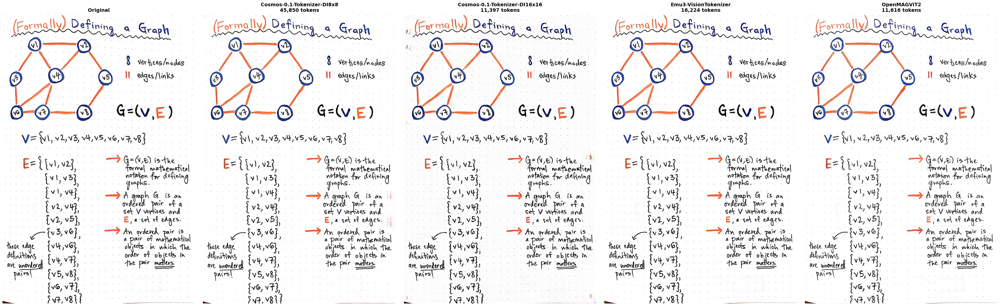

In [9]:
compare_image('graph_theory1')

Comparing image: line_chart


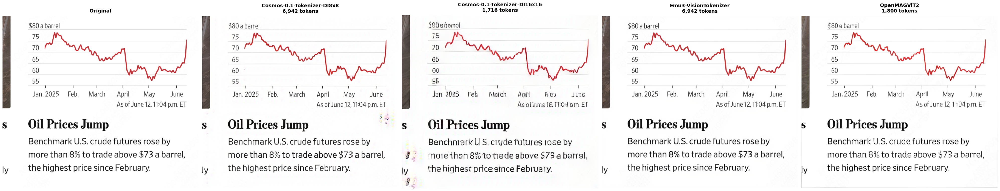

In [10]:
compare_image('line_chart')

Comparing image: math_draft1


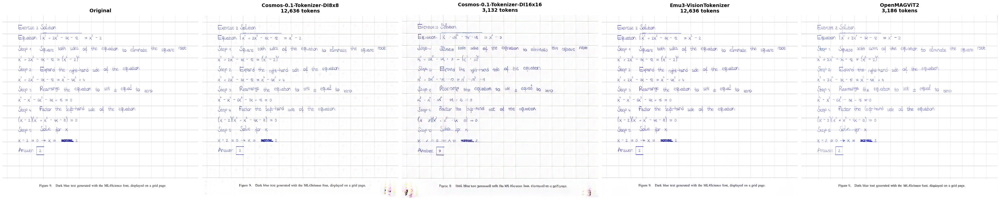

In [11]:
compare_image('math_draft1')


Comparing image: logo2


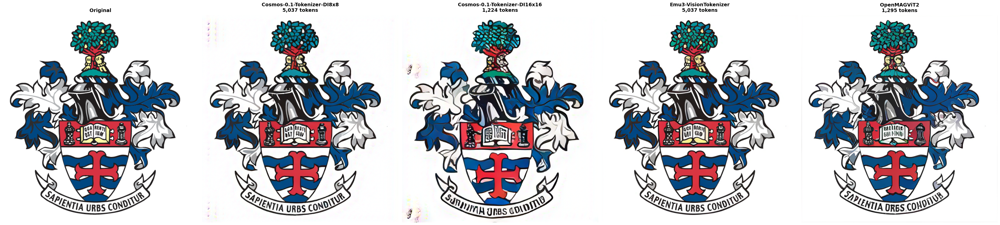

In [12]:
compare_image('logo2')
